In [1]:
!pip install yfinance -q
!pip install plotly -q
!pip install matplotlib -q
!pip install pandas -q
!pip install ta -q
!pip install tensorflow-macos -q


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import yfinance as yf
import plotly.graph_objects as go  ## better display graphs
import ta

In [3]:
## Example pulling Microsoft Stock

In [4]:
msft = yf.Ticker("MSFT")

In [5]:
hist = msft.history(period="max")

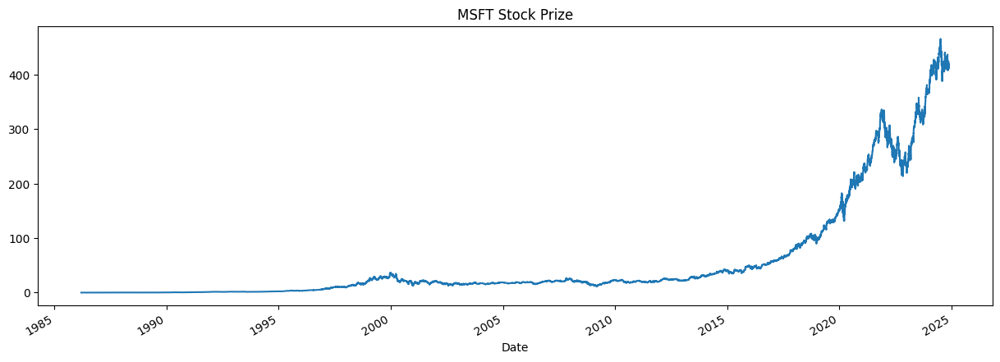

In [6]:
hist['Open'].plot(figsize=(15,5), title = "MSFT Stock Prize")
plt.show()

In [7]:
msft.balance_sheet

,2024-06-30,2023-06-30,2022-06-30,2021-06-30
Ordinary Shares Number,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Share Issued,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Net Debt,33315000000.0,12533000000.0,35850000000.0,43922000000.0
Total Debt,67127000000.0,59965000000.0,61270000000.0,67775000000.0
Tangible Book Value,121660000000.0,128971000000.0,87720000000.0,84477000000.0
...,...,...,...,...
Cash Cash Equivalents And Short Term Investments,75531000000.0,111256000000.0,104749000000.0,130256000000.0
Other Short Term Investments,57216000000.0,76552000000.0,90818000000.0,116032000000.0
Cash And Cash Equivalents,18315000000.0,34704000000.0,13931000000.0,14224000000.0
Cash Equivalents,6744000000.0,26226000000.0,5673000000.0,6952000000.0


In [8]:
msft.calendar

{'Dividend Date': datetime.date(2024, 12, 11),
 'Ex-Dividend Date': datetime.date(2024, 11, 20),
 'Earnings Date': [datetime.date(2025, 1, 28), datetime.date(2025, 2, 3)],
 'Earnings High': 3.47,
 'Earnings Low': 3.08,
 'Earnings Average': 3.15862,
 'Revenue High': 70520000000,
 'Revenue Low': 68488700000,
 'Revenue Average': 68912341850}

In [9]:
## Pulling other stocks
## top 10 stocks to buy in 2024

In [10]:
stonks = ['MSFT','NVDA','GOOGL','META','JPM','XOM','MA','CRM','AMD','AXP','MS']

In [11]:
hists = {}
for s in stonks:
    tkr = yf.Ticker(s)
    history = tkr.history(period='10y')  ## pulling 10 year data
    hists[s] = history

In [12]:
## Plotting the stock prize

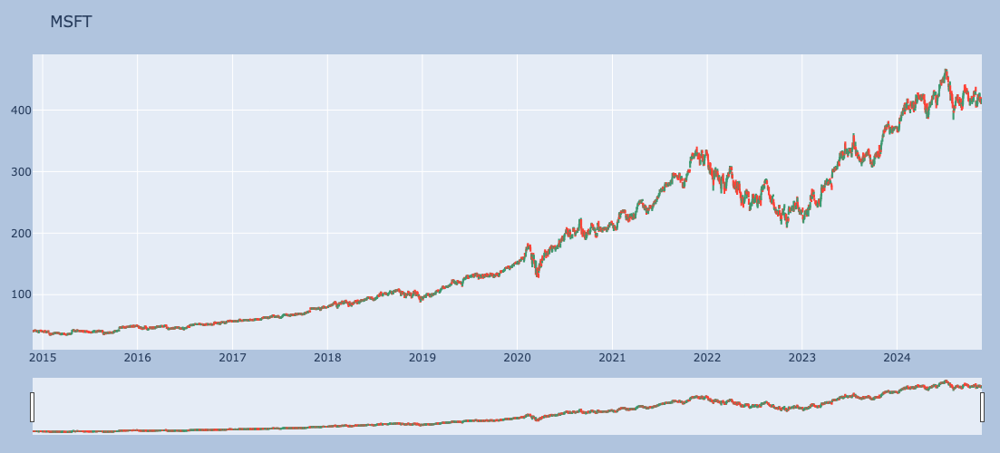

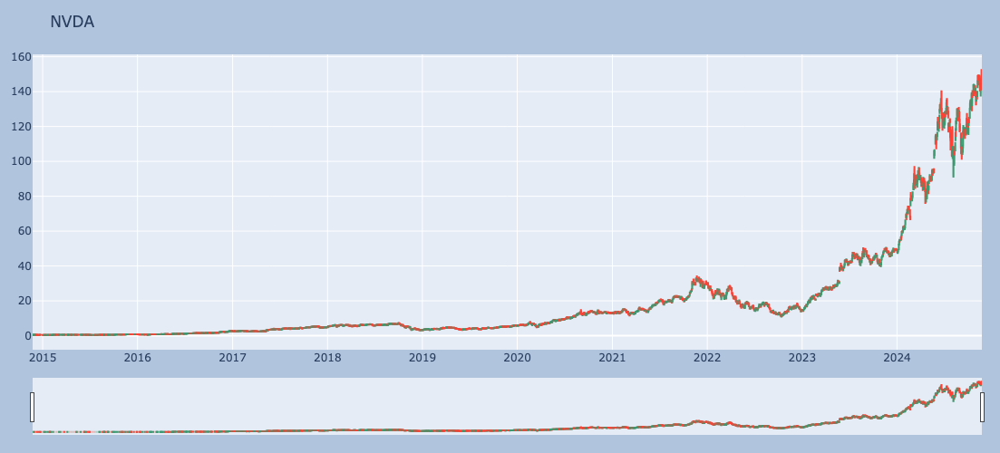

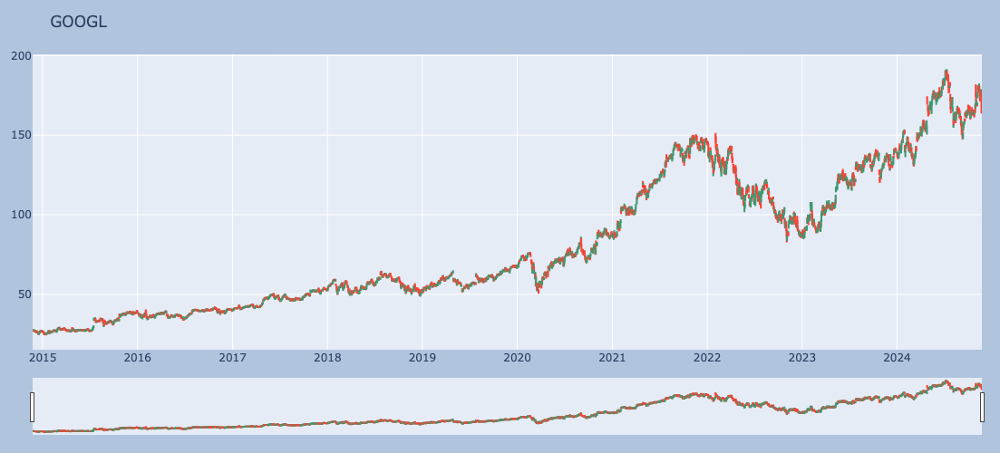

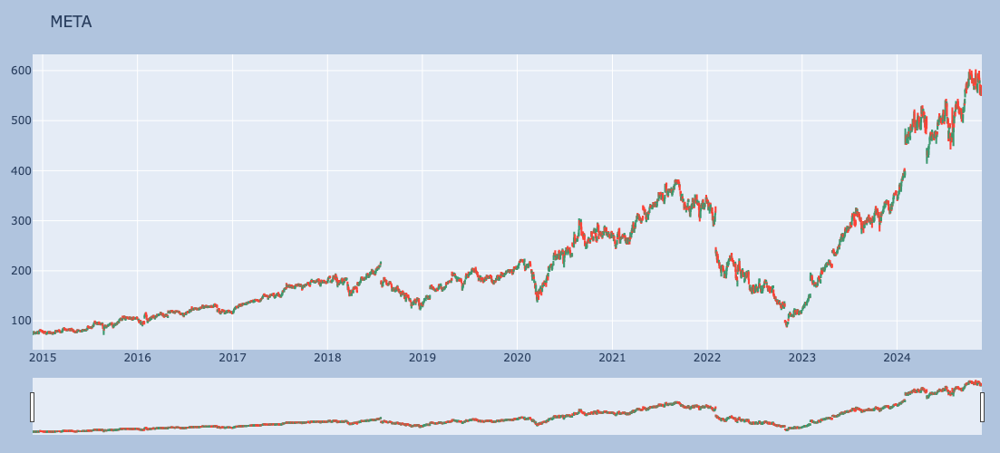

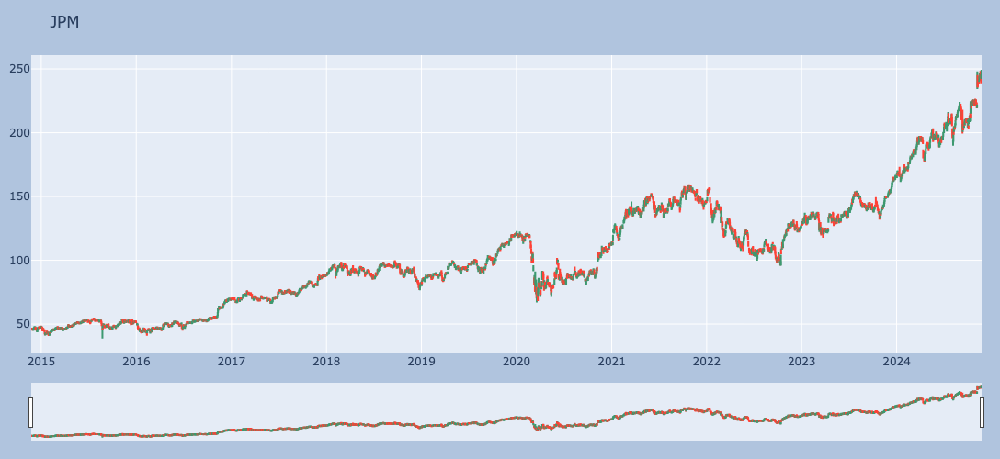

...

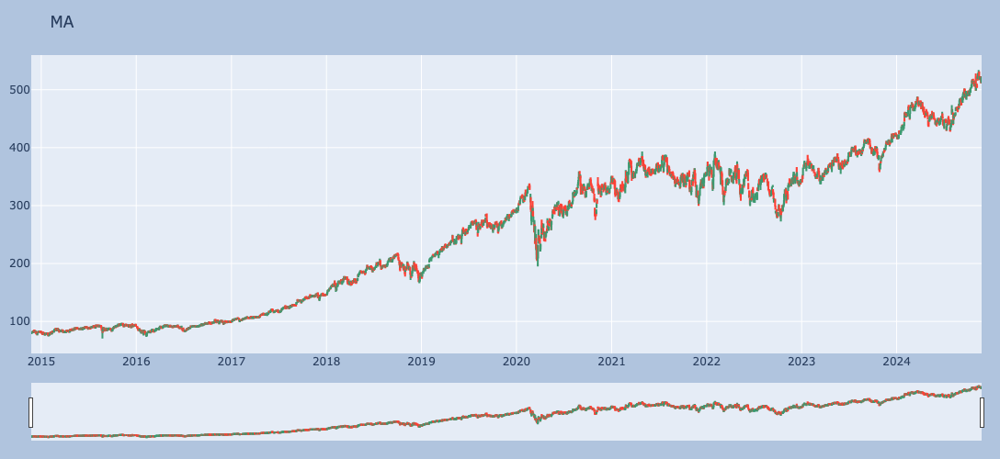

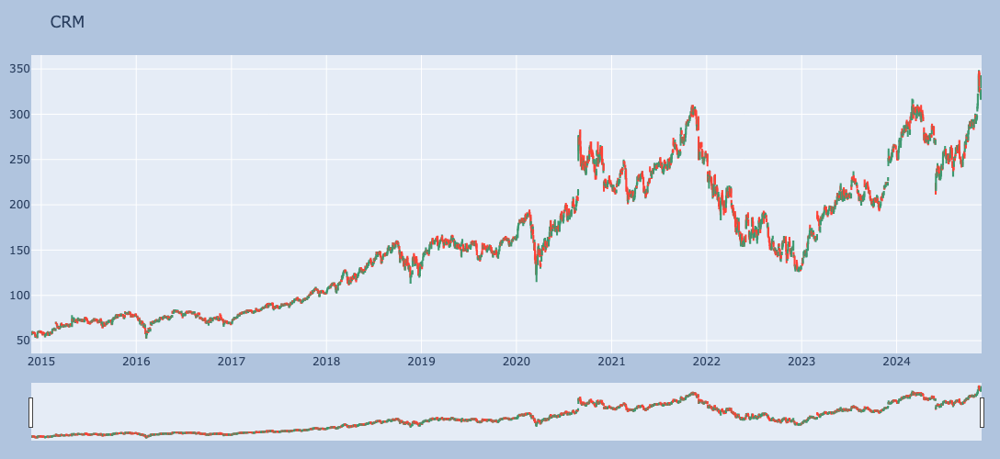

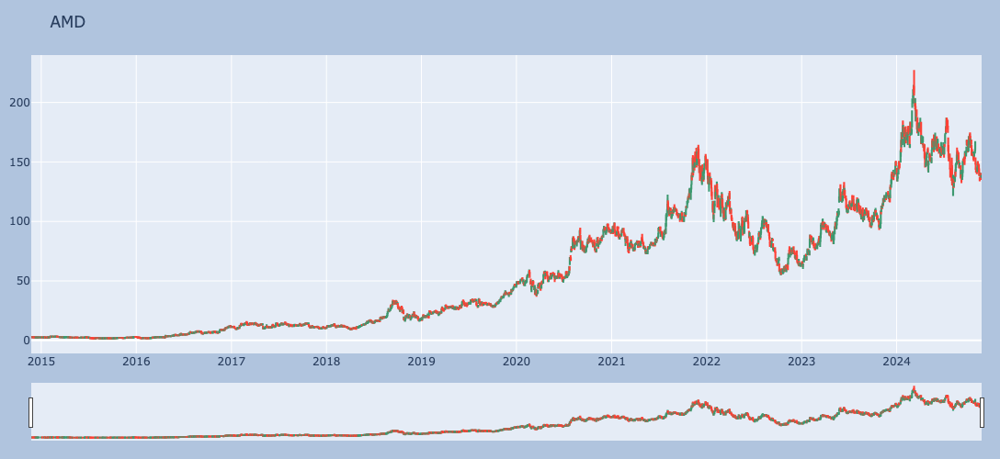

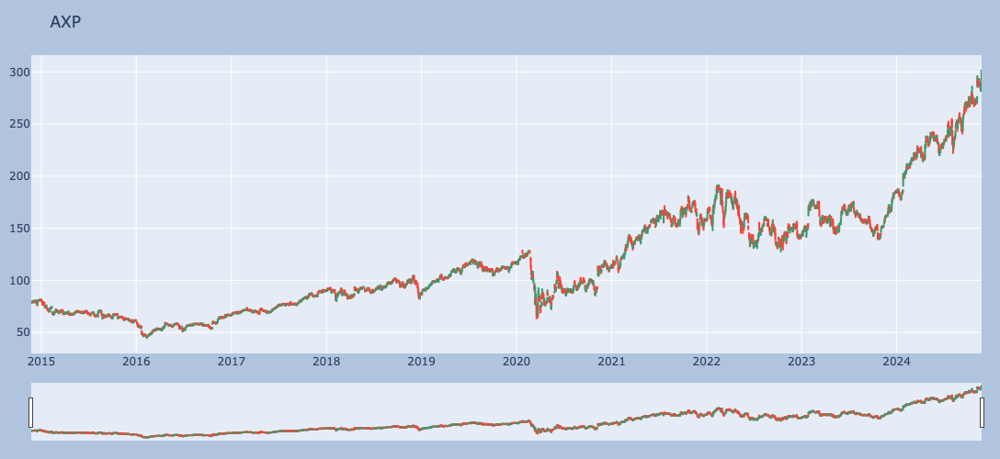

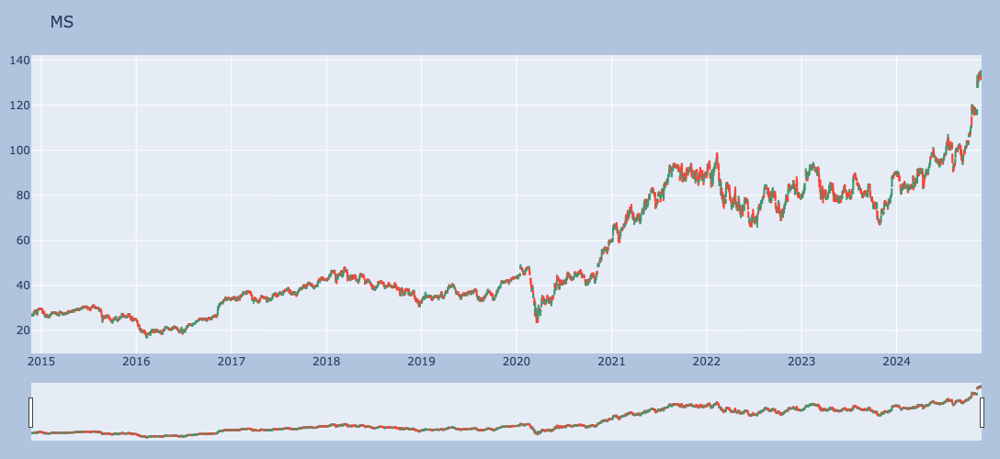

In [13]:
for stock in stonks:
    temp_df = hists[stock].copy()
    
    fig = go.Figure(
        data=[
            go.Candlestick(
                x = temp_df.index,
                open = temp_df["Open"],
                high = temp_df["High"],
                low = temp_df["Low"],
                close = temp_df["Close"],
            )
        ]
    )
    
    fig.update_layout(
        margin = dict(l=20, r=20, t=60, b=20),
        height = 500,
        paper_bgcolor = "LightSteelBlue",
        title = stock,
    )
    
    fig.show()

In [14]:
# Calculating Moving averages
# SMA - Simple Moving Average
# SMA = (Closing Price Day 1 + Closing Price Day 2 + ... + Closing Price Day N) / N
# N = the number of days in the period you are calculating the average for. 

# Moving averages smooth out price fluctuations and help identify trends.

In [15]:
# Adding more advanced features for better predictions
for stock, data in hists.items():
    data['SMA_10'] = data['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
    data['SMA_50'] = data['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
    data['EMA_10'] = data['Close'].ewm(span=10, adjust=False).mean()  # Exponential Moving Average
    data['RSI'] = ta.momentum.rsi(data['Close'], window=14)  # Relative Strength Index
    data['MACD'] = ta.trend.macd(data['Close'])  # MACD (Moving Average Convergence Divergence)
    data['Volume_Change'] = data['Volume'].pct_change()  # Volume percentage change
    data.dropna(inplace=True)  # Drop NaN rows caused by rolling calculations

In [16]:
from sklearn.preprocessing import MinMaxScaler

# Ensure you are working with the correct data from 'msft_data'
msft_data = hists['MSFT'][['Close', 'SMA_10', 'SMA_50', 'EMA_10', 'RSI', 'MACD', 'Volume_Change']].dropna()

# Define features (X) and target variable (y)
X = msft_data[['SMA_10', 'SMA_50', 'EMA_10', 'RSI', 'MACD', 'Volume_Change']]
y = msft_data['Close']

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Scale features and target variable
X_scaled = scaler.fit_transform(X)  # Scaled features
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))  # Scaled target

# Create sequential data for LSTM
def create_sequences(X, y, time_steps=10):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:i + time_steps])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

time_steps = 10  # Number of past days used for prediction
X_seq, y_seq = create_sequences(X_scaled, y_scaled, time_steps)

# Split the sequential data into training and testing sets
split_idx = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]


In [17]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# LSTM Model
model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    LSTM(50, return_sequences=False),
    Dropout(0.2),
    Dense(25, activation='relu'),
    Dense(1)  # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_test, y_test), verbose=1)

# Predictions
predictions = model.predict(X_test)
predictions_rescaled = scaler.inverse_transform(predictions)
y_test_rescaled = scaler.inverse_transform(y_test)


Epoch 1/50


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0356 - val_loss: 0.0030
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0013 - val_loss: 0.0034
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 0.0054
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5963e-04 - val_loss: 0.0067
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8443e-04 - val_loss: 0.0112
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 0.0098
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7902e-04 - val_loss: 0.0067
Epoch 8/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0484e-04 - val_loss: 0.0058
Epoch 9/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8195e-04 - val_loss: 0.0104
Epoch 10/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7701e-04 - val_loss: 0.0172
Epoch 11/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0897e-04 - val_loss: 0.0076
Epoch 12/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss

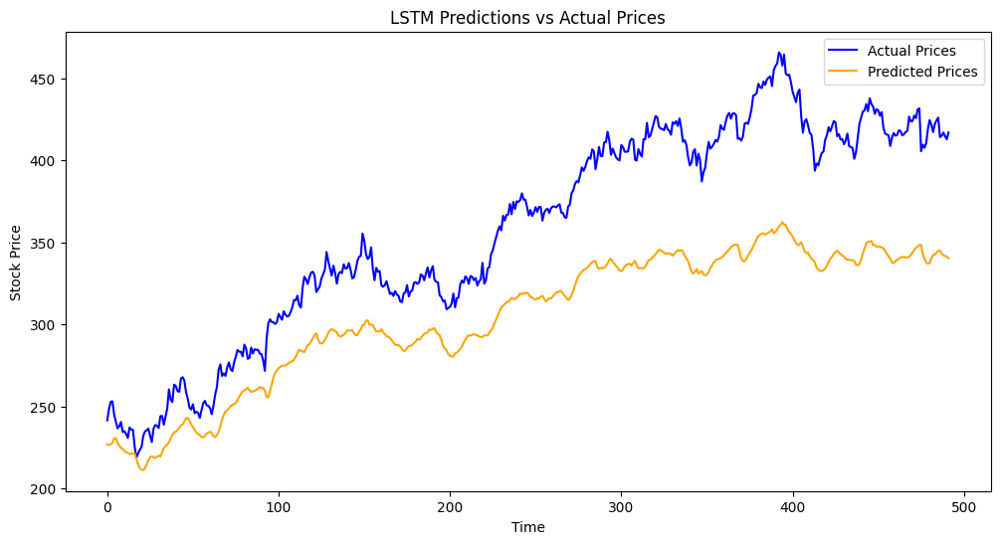

MSE: 3359.3902015130548
MAE: 52.461782470951235
R-squared: 0.19478796157990208


In [18]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score  # Import these functions

# Plot predictions vs actual prices
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label="Actual Prices", color="blue")
plt.plot(predictions_rescaled, label="Predicted Prices", color="orange")
plt.legend()
plt.title("LSTM Predictions vs Actual Prices")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.show()

# Model Evaluation
mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
mae = mean_absolute_error(y_test_rescaled, predictions_rescaled)
r2 = r2_score(y_test_rescaled, predictions_rescaled)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


In [19]:
# Get the predicted stock price for the most recent test data
predicted_stock_price = predictions_rescaled[-1][0]  # Extract the last predicted value
print(f"The predicted stock price for the most recent test data is: ${predicted_stock_price:.2f}")


The predicted stock price for the most recent test data is: $340.34


In [20]:
# Get the date corresponding to the last prediction
predicted_date = msft_data.iloc[len(X_train) + len(X_test) - 1].name
print(f"The predicted stock price of ${predicted_stock_price:.2f} corresponds to the date: {predicted_date}")


The predicted stock price of $340.34 corresponds to the date: 2024-11-08 00:00:00-05:00


In [21]:
# Get the actual stock price for the same date
actual_stock_price = y_test_rescaled[-1][0]
print(f"The actual stock price for {predicted_date} is: ${actual_stock_price:.2f}")


The actual stock price for 2024-11-08 00:00:00-05:00 is: $417.00


In [22]:
# Calculate MAPE
mape = np.mean(np.abs((y_test_rescaled - predictions_rescaled) / y_test_rescaled)) * 100
accuracy = 100 - mape

print(f"MAPE: {mape:.2f}%")
print(f"Model Accuracy: {accuracy:.2f}%")


MAPE: 13.87%
Model Accuracy: 86.13%


In [23]:
# Trying to integratet sentiment analysis

In [24]:
# Install required libraries
!pip install yfinance -q
!pip install vaderSentiment -q

import yfinance as yf
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the Sentiment Analyzer
analyzer = SentimentIntensityAnalyzer()

# Define the function to fetch headlines
def fetch_yahoo_finance_headlines(ticker):
    stock = yf.Ticker(ticker)
    # Using yahoo_fin or yfinance descriptions/news (if available)
    news = stock.news  # This fetches recent headlines
    headlines = [item['title'] for item in news]  # Extract titles
    timestamps = [item['providerPublishTime'] for item in news]  # Extract timestamps
    return headlines, timestamps

# Analyze sentiment
def analyze_sentiment(headlines):
    sentiments = []
    for headline in headlines:
        sentiment_score = analyzer.polarity_scores(headline)
        sentiments.append(sentiment_score)
    return sentiments

# Fetch and analyze sentiment for MSFT
headlines, timestamps = fetch_yahoo_finance_headlines("MSFT")
sentiment_scores = analyze_sentiment(headlines)

# Convert to DataFrame
sentiment_df = pd.DataFrame(sentiment_scores)
sentiment_df['headline'] = headlines
sentiment_df['timestamp'] = pd.to_datetime(timestamps, unit='s')  # Convert Unix timestamps to datetime

# Display the sentiment DataFrame
print("Sentiment Analysis of MSFT Headlines")
print(sentiment_df[['timestamp', 'headline', 'neg', 'neu', 'pos', 'compound']])



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Sentiment Analysis of MSFT Headlines
            timestamp                                           headline  \
0 2024-11-24 05:17:54  Teradata Corporation (TDC) Launches AI Unlimit...   
1 2024-11-24 02:05:57  Microsoft Corporation (MSFT) Unveils New AI Pr...   
2 2024-11-23 23:30:00  This Dividend King Is on Track to Join the $1 ...   
3 2024-11-23 21:58:09  The Intercept Wins a Round in Suit Against OpenAI   
4 2024-11-23 16:05:00  1 Unstoppable Growth Stock That Could Join Nvi...   
5 2024-11-23 14:37:35  Is Microsoft Corporation (MSFT) AI News Should...   
6 2024-11-23 13:30:00  Billionaire Israel Englander Is Selling Nvidia...   
7 2024-11-23 12:37:00               Here's My Top Stock to Buy Right Now   

     neg    neu    pos  compound  
0  0.000  0.884  0.11

Epoch 1/50


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.2041 - val_loss: 0.0469
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0768 - val_loss: 0.0124
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0340 - val_loss: 0.0532
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0452 - val_loss: 0.0128
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0277 - val_loss: 0.0089
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0373 - val_loss: 0.0089
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0292 - val_loss: 0.0143
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0268 - val_loss: 0.0201
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0279 - val_loss: 0.0117
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0277 - val_loss: 0.0103
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0205 - val_loss: 0.0111
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0222 - val_loss: 0.0117
Epoch 13/50
5/5 ━━━━━━━

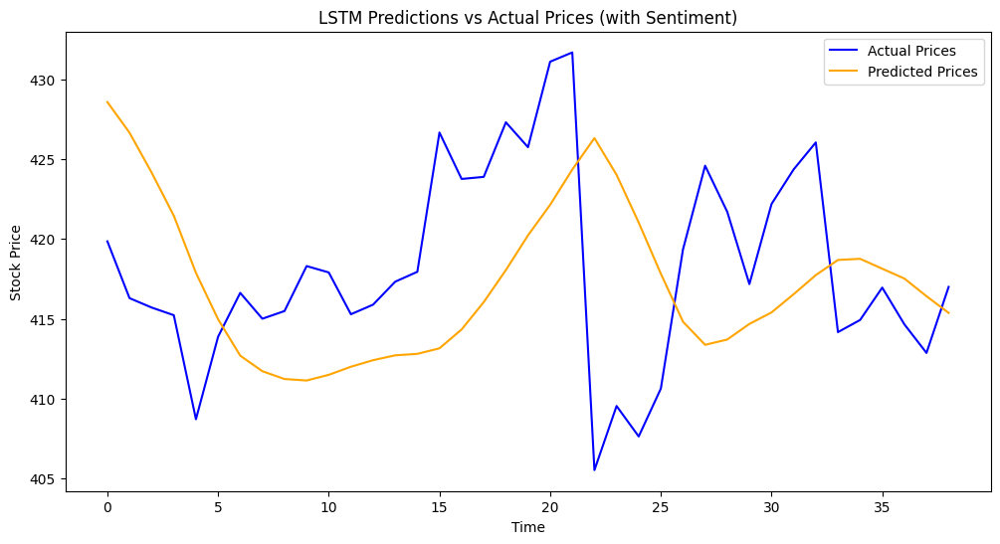

MSE: 63.83581106316959
MAE: 6.915989019931883
R-squared: -0.7395461854832872


In [25]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize Sentiment Analyzer
analyzer = SentimentIntensityAnalyzer()

# Fix for converting timestamps to dates
def fetch_and_analyze_sentiment(ticker):
    stock = yf.Ticker(ticker)
    news = stock.news  # Fetch headlines
    headlines = [item['title'] for item in news]
    timestamps = [item['providerPublishTime'] for item in news]
    
    # Sentiment Analysis
    sentiment_scores = []
    for headline in headlines:
        sentiment_score = analyzer.polarity_scores(headline)
        sentiment_scores.append(sentiment_score)
    
    # Create DataFrame
    sentiment_df = pd.DataFrame(sentiment_scores)
    sentiment_df['timestamp'] = pd.to_datetime(timestamps, unit='s').date  # Use .date directly
    daily_sentiment = sentiment_df.groupby('timestamp').mean().reset_index()
    
    return daily_sentiment

# Fetch and integrate sentiment data for MSFT
sentiment_data = fetch_and_analyze_sentiment("MSFT")
sentiment_data.rename(columns={'timestamp': 'Date'}, inplace=True)


# Prepare stock data
msft = yf.Ticker("MSFT")
msft_data = msft.history(period='1y')  # Use 1 year of data for example
msft_data['Date'] = msft_data.index.date
msft_data.reset_index(drop=True, inplace=True)

# Merge stock data with sentiment data
msft_data = pd.merge(msft_data, sentiment_data, on='Date', how='left')
msft_data.fillna(0, inplace=True)  # Fill missing sentiment values with 0

# Add technical indicators
msft_data['SMA_10'] = msft_data['Close'].rolling(window=10).mean()
msft_data['SMA_50'] = msft_data['Close'].rolling(window=50).mean()
msft_data['EMA_10'] = msft_data['Close'].ewm(span=10, adjust=False).mean()
msft_data['RSI'] = ta.momentum.rsi(msft_data['Close'], window=14)
msft_data['MACD'] = ta.trend.macd(msft_data['Close'])
msft_data['Volume_Change'] = msft_data['Volume'].pct_change()
msft_data.dropna(inplace=True)

# Define features and target variable
features = ['SMA_10', 'SMA_50', 'EMA_10', 'RSI', 'MACD', 'Volume_Change', 'compound']
X = msft_data[features]
y = msft_data['Close']

# Scale data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

# Create sequences for LSTM
def create_sequences(X, y, time_steps=10):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:i + time_steps])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

time_steps = 10
X_seq, y_seq = create_sequences(X_scaled, y_scaled, time_steps)

# Train-test split
split_idx = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]

# Build LSTM Model
model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    LSTM(50, return_sequences=False),
    Dropout(0.2),
    Dense(25, activation='relu'),
    Dense(1)
])

# Compile and Train the Model
model.compile(optimizer='adam', loss='mean_squared_error')
history = model.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_test, y_test), verbose=1)

# Predictions
predictions = model.predict(X_test)
predictions_rescaled = scaler.inverse_transform(predictions)
y_test_rescaled = scaler.inverse_transform(y_test)

# Plot Predictions vs Actual
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label="Actual Prices", color="blue")
plt.plot(predictions_rescaled, label="Predicted Prices", color="orange")
plt.legend()
plt.title("LSTM Predictions vs Actual Prices (with Sentiment)")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.show()

# Evaluate Model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
mae = mean_absolute_error(y_test_rescaled, predictions_rescaled)
r2 = r2_score(y_test_rescaled, predictions_rescaled)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")
